In [3]:
%matplotlib inline
from tensorflow.keras.applications.resnet50 import preprocess_input
#from imagenet_utils import preprocess_input
from keras.preprocessing import image
from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.colors as mcolor
import numpy as np
import h5py
import os
import tensorflow as tf
from PIL import Image
import re
from scipy.spatial.distance import cosine as cosine_distance
from sklearn.decomposition import PCA
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from tqdm import tqdm
from tensorflow.python.keras.applications.vgg19 import VGG19
#from vgg19 import VGG19
from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.optimizers import Adam, SGD
#from keras.backend.tensorflow_backend import set_session
from tensorflow.python.keras.backend import set_session


#config = tf.ConfigProto()
config = tf.compat.v1.ConfigProto()

config.gpu_options.per_process_gpu_memory_fraction = 0.25
#set_session(tf.Session(config=config))
sess = tf.compat.v1.Session(config=config)


In [2]:
pip install tensorflow-gpu


In [3]:
class Util:
    video = None
    base_path = None
    features = None
    
    @staticmethod
    def stringify(i):
        return 'fig{0:08d}.jpg'.format(i)
    
    @staticmethod
    def get_integer(s):
        match = re.match(r'fig(\d+)\.jpg', s)

        if match: return int(match.group(1))
        else: return None
        
    @staticmethod
    def open_image_as_array(frame):
        im = Image.open(os.path.join(base_path, video, frame))
        return np.asarray(im, dtype=float) / 255
    
    @staticmethod
    def set_props(_base_path, _video):
        base_path = _base_path
        video = _video
        
    @staticmethod
    def set_features(_features):
        Util.features = _features
        
    @staticmethod
    def get_features():
        return Util.features
        
    @staticmethod
    def correlate_distances(frames, do_plot=False):
        dist_matrix = []
        dist_nonself_matrix = {}
        dist_dense_matrix = []
        index = 0

        for anchor_frame in frames:
            dist_matrix.append([])
            dist_nonself_matrix[anchor_frame] = {}
            dist_dense_matrix.append([])
            for compare_frame in frames:
                af = Util.features[anchor_frame]
                bf = Util.features[compare_frame]
                dist = cosine_distance(af, bf)
                dist_matrix[index].append(dist)
                #print('{0:s} <-> {1:s} = {2:.2f}'.format(anchor_frame, compare_frame, dist))

                if anchor_frame != compare_frame: 
                    dist_dense_matrix[index].append(dist)
                    dist_nonself_matrix[anchor_frame][compare_frame] = dist

            index = index + 1

        if do_plot:
            column_labels = frames
            row_labels = frames
            fig, axes = plt.subplots()
            heatmap = axes.pcolor(dist_matrix, cmap=plt.cm.Blues, alpha=0.8)
            fig = plt.gcf()
            fig.set_size_inches(8, 11)
            axes.set_yticks(np.arange(len(dist_matrix)) + 0.5, minor=False)
            axes.set_xticks(np.arange(len(dist_matrix)) + 0.5, minor=False)

            axes.set_xticklabels(frames, minor=False)
            axes.set_yticklabels(frames, minor=False)
            plt.xticks(rotation=90)
            plt.title('Keyframes Cosine Distance Correlation')

        return dist_dense_matrix, dist_nonself_matrix
    @staticmethod
    def generate_scenes(frames):
        scenes = []
        for f in range(0, len(frames)):
            f_min = Util.get_integer(frames[f])

            if f == 0 and f_min > 0:
                scenes.append([0, f_min])
            
            if (f + 1) > len(frames) - 1:
                f_max = len(Util.features) - 1
            else:
                f_max = Util.get_integer(frames[f + 1]) - 1

            scenes.append([f_min, f_max])
        return scenes

    @staticmethod
    def get_prominent_frames(frames):
        out_frames = []
        
        for scene in Util.generate_scenes(frames):
            max_sat = 0
            max_lv = 0
            prominent_frame = None
            for i in tqdm(range(scene[0], scene[1] + 1)):
                frame = Util.stringify(i)
                ia = Util.open_image_as_array(frame)
                sat, lv = SatLightStats.get_sv(ia)

                if (lv > max_lv):
                    max_lv = lv
                    prominent_frame = frame

            out_frames.append(prominent_frame)
            plt.figure()
            im = Image.open(os.path.join(base_path, video, prominent_frame))
            ia = np.asarray(im)
            imshow(ia)
            plt.title(prominent_frame)

        return out_frames
    
    @staticmethod
    def dump_frames(frames):
        for frame in frames:
            plt.figure()
            ia = Util.open_image_as_array(frame)
            imshow(ia)
            plt.title(frame)
            
    @staticmethod
    def dump_frame_index(frames):
        path = os.path.join(base_path, video, 'keyframes.txt')
        with open(path, 'w') as f:
            for frame in frames:
                fi = str(Util.get_integer(frame))
                print(fi)
                f.write(fi + "\n")
                
        print('Keyframes info written to ' + path)
    @staticmethod
    def pack_features(frames):
        pack_frames, pack_features = Util.pack(frames)

        with (h5py.File('features_' + video + '.h5', 'w')) as f:
            f.create_dataset('frames', data=pack_frames)
            f.create_dataset('features', data=pack_features)
        #f = h5py.File(out, 'w')
        #f.create_dataset('features', data=Util.features)
        #f.close()
        
    @staticmethod
    def pack(frames):
        frame_data = np.zeros((len(frames), 1), dtype=int)
        features_data = np.zeros((len(frames), 7*7*512), dtype=float)
        
        for index, frame in enumerate(frames):
            frame_data[index] = (Util.get_integer(frame))
            
        for index, frame in enumerate(frames):
            fl = Util.features[frame].flatten()
            features_data[index,:] = Util.features[frame].flatten()
        
        return frame_data, features_data

In [4]:
class SatLightStats:
    max_val = 352 * 288
    @staticmethod
    def get_sv(a):
        hsv = mcolor.rgb_to_hsv(a)
        
        saturation = np.sum(hsv[:,:,1])
        lightness = np.sum(hsv[:,:,2])

        return saturation / SatLightStats.max_val, lightness / SatLightStats.max_val
    
    @staticmethod
    def get_stats_min():
        sats = []
        lvs = []

        for frame in tqdm(Util.get_features()):
            #im = Image.open(os.path.join(base_path, video, frame))
            ia = Util.open_image_as_array(frame)#np.asarray(im)
            sat, lv = SatLightStats.get_sv(ia)
            sats.append(sat)
            lvs.append(lv)

        sat_stdev = np.std(sats)
        sat_mean = np.mean(sats)
        lv_stdev = np.std(lvs)
        lv_mean = np.mean(lvs)

        return sat_mean - sat_stdev, lv_mean - lv_stdev
    
    @staticmethod
    def filter_by_lightness(frames):
        sat_lb, lv_lb = SatLightStats.get_stats_min()
        new_frames = []
        for frame in frames:
            ia = Util.open_image_as_array(frame)
            sat, lv = SatLightStats.get_sv(ia)
            
            if (lv > lv_lb):
                new_frames.append(frame)
                
        return new_frames

In [5]:
class KeyFrameExtractor:
    features = {}
    model = VGG19(weights='imagenet', include_top=False)
    base_path = None
    video = None
    
    def __init__(self, base_path, video):
        self.features = {}
        self.base_path = base_path
        self.video = video
        
    def get_feature(self, fig):
        path = os.path.join(self.base_path, self.video, 'fig{0:08d}.jpg'.format(fig))
        img = image.load_img(path, target_size=(224,224))
        x = image.img_to_array(img)
        x = np.expand_dims(x, axis=0)
        x = preprocess_input(x)

        return self.model.predict(x)
    
    def build_features(self):
        for filename in tqdm(sorted(os.listdir(os.path.join(self.base_path, self.video)))):
            digit = Util.get_integer(filename)

            if digit is not None:
                self.features[filename] = self.get_feature(digit).flatten()
    
    def get_features(self):
        return self.features

In [6]:
class FirstOrderDifferentiator:
    init_threshold = 0.5
    dist_frame_max = 300
    dist_frame_min = 40
    keyframes = []
    best_efforts = {}
    
    current_frame = 1
    last_keyframe = 0
    dyna_threshold = init_threshold
    differentiator = 0
    differentiator_has_been_set = False
    min_differentiator = 0.001
    dflt_gave_up = False
    dfgt_gave_up = False
    features = []
    
    def __init__(self):
        self.keyframes = []
        self.keyframes.append(Util.stringify(0))
        self.init_threshold = 0.5
        self.dist_frame_max = 300
        self.dist_frame_min = 40
        self.best_efforts = {}
        
        self.current_frame = 1
        self.last_keyframe = 0
        self.dyna_threshold = self.init_threshold
        self.differentiator = 0
        self.differentiator_has_been_set = False
        self.min_differentiator = 0.001
        self.dflt_gave_up = False
        self.dfgt_gave_up = False
        self.features = Util.get_features()
        
    def compute(self):
        while True:
            dist = self.compute_distance()

            if dist > self.dyna_threshold or self.is_last_frame():
                dflt = self.delta_frame_less_than_threshold()
                dfgt = self.delta_frame_greater_than_threshold()

                if dflt:
                    self.reset_to_last_keyframe()
                    self.set_threshold('higher')
                elif dfgt:
                    self.reset_to_last_keyframe()
                    self.set_threshold('lower')
                else: 
                    if self.dflt_gave_up and self.dfgt_gave_up:
                        self.find_best_effort_differentiator()
                    else:
                        self.add_keyframe()

                    self.reset_differentiator()
                    
            if not self.next_frame():
                break;
    def compute_distance(self):
        si_0 = Util.stringify(self.current_frame - 1)
        si_1 = Util.stringify(self.current_frame)
        return cosine_distance(self.features[si_0], self.features[si_1])
    
    def is_last_frame(self):
        return self.current_frame == (len(self.features) - 1)
    
    def find_best_effort_differentiator(self):
        delta_delta = 999999
        best_effort = None
        for _delta_frame, diffs in self.best_efforts.items():
            zdelta = 0
            delta_frame = int(_delta_frame)
            if delta_frame <  self.dist_frame_min:
                zdelta = abs(self.dist_frame_min - delta_frame)
            elif delta_frame > self.dist_frame_max:
                zdelta = abs(self.dist_frame_max - delta_frame)

            if zdelta < delta_delta:
                delta_delta = zdelta
                best_effort = self.best_efforts[_delta_frame][0]

        print('Best effort delta is ' + str(delta_delta))
        self.current_frame = self.last_keyframe + delta_delta
        self.last_keyframe = self.current_frame
        print('YYY Using best effort differentiator. Current frame set to {0:d}', self.current_frame)
        
    def add_keyframe(self):
        print('Adding to keyframe {0:s}, delta_frame = {1:d}'.format(Util.stringify(self.current_frame), self.current_frame - self.last_keyframe))
        self.keyframes.append(Util.stringify(self.current_frame))
        self.last_keyframe = self.current_frame
        
    def differentiator_too_low(self):
        if self.differentiator_has_been_set:
            return self.differentiator < self.min_differentiator

        return False
    
    def delta_frame_less_than_threshold(self):
        if self.differentiator_too_low(): 
            self.dflt_gave_up = True
            return False

        return (self.current_frame - self.last_keyframe) < self.dist_frame_min
    
    def delta_frame_greater_than_threshold(self):
        if self.differentiator_too_low(): 
            self.dfgt_gave_up = True
            return False

        return (self.current_frame - self.last_keyframe) > self.dist_frame_max
    
    def next_frame(self):
        self.current_frame = self.current_frame + 1

        return self.current_frame < len(self.features)
    def reset_differentiator(self):
        self.differentiator = 0
        self.differentiator_has_been_set = False
        self.dflt_gave_up = False
        self.dfgt_gave_up = False
        self.best_efforts = {}

        if self.dyna_threshold > self.init_threshold:
            self.dyna_threshold = self.init_threshold
            
    def reset_to_last_keyframe(self):
        self.update_best_efforts()
        print('<-- Resetting from {0:d} to frame {1:d}'.format(self.current_frame, self.last_keyframe))
        self.current_frame = self.last_keyframe
            
    def set_threshold(self, mode):
        old_dyna_threshold = self.dyna_threshold

        if mode == 'lower':
            if self.differentiator == 0:
                self.differentiator = self.dyna_threshold
            else:
                self.differentiator = self.differentiator / 2

            self.dyna_threshold = self.dyna_threshold - self.differentiator / 2
        elif mode == 'higher':
            if self.differentiator == 0:
                self.differentiator = 1.0 - self.dyna_threshold
            else:
                self.differentiator = self.differentiator / 2

            self.dyna_threshold = self.dyna_threshold + self.differentiator / 2

        self.differentiator_has_been_set = True

        print('^^^ Adjusting threshold {0:.1f} -> {1:.1f} | d = {2:.4f}'.format(old_dyna_threshold, self.dyna_threshold, self.differentiator))
        
    def update_best_efforts(self):
        best_delta_frame = self.current_frame - self.last_keyframe
        if str(best_delta_frame) not in self.best_efforts:
            self.best_efforts[str(best_delta_frame)] = []

        self.best_efforts[str(best_delta_frame)].append(self.differentiator)
        
    def get_keyframes(self):
        return self.keyframes
    

In [7]:
class SimilarityMatcher:
    def __init__(self, frames, dense, friendly):
        self.dense = dense
        self.friendly = friendly
        self.frames = frames
        self.process()
        
    def process(self):
        new_frames = []
        similars = self.get_similar_keyframes()
        eliminated = self.vote_similars(similars)
        
        for frame in self.frames:
            if frame not in eliminated:
                new_frames.append(frame)
                
        return new_frames
        
    def get_dist_lower_bound(self):
        return np.mean(self.dense) - 2 * np.std(self.dense) # this is very arbitrary WTF???
    
    def get_dist_upper_bound(self):
        return np.mean(self.dense) + 2 * np.std(self.dense)
    
    def get_similar_keyframes(self):
        dist_lb = self.get_dist_lower_bound()
        similars = {}
        processed = set()

        for keyframe, kds in self.friendly.items():
            cviz = []
            for compframe, corr in kds.items():
                if corr < dist_lb:
                    cviz.append(compframe)

            if len(cviz) > 0:
                #im = Image.open(os.path.join(base_path, video, keyframe))
                #ia = np.asarray(im)
                #plt.figure()
                #plt.imshow(ia)
                #plt.title('Keyframe {0:s}'.format(keyframe))
                #print("Keyframe {0:s}".format(keyframe))

                if keyframe not in processed:
                    similars[keyframe] = []
                    processed.add(keyframe)
                for frame in cviz:
                    #im = Image.open(os.path.join(base_path, video, frame))
                    #ia = np.asarray(im)
                    #plt.figure()
                    #plt.imshow(ia)
                    #plt.title('Similar frame {0:s}'.format(frame))
                    #print(" --> Similar frame {0:s}".format(frame))

                    if frame not in processed:
                        if keyframe in similars:
                            similars[keyframe].append(frame)
                            processed.add(frame)

        return similars
    def vote_similars(self, h):
        candidates = []
        for a, ss in h.items():
            candidates.append(a)
            for s in ss: candidates.append(s)

        eliminated = self.vote(candidates)
        return eliminated
    
    def vote(self, candidates):
        max_lv = 0
        max_cand = None
        remaining = candidates

        for candidate in candidates:
            ia = Util.open_image_as_array(candidate)
            sat, lv = SatLightStats.get_sv(ia)

            if lv > max_lv:
                max_lv = lv
                max_cand = candidate
            else:
                remaining.remove(candidate)

        return remaining

In [8]:
class SecondPass:
    def __init__(self, scenes):
        self.scenes = scenes
        
    def get_frames(self):
        return self.frames
        
    def process(self, variance=0.8):
        self.variance = variance
        new_frames = []
        for scene in self.scenes:
            frames = []

            for f in range(scene[0], scene[1] + 1):
                frames.append(Util.stringify(f))

            print('Analyzing frames {0:d} to {1:d}...'.format(scene[0], scene[1] + 1))
            dense, nonself = Util.correlate_distances(frames, do_plot=False)

            if len(dense) > 1:
                n_components = self.try_fit_pca(dense)
                new_clusters = self.get_new_frames(dense, frames, n_components)

                for new_frame in sorted(new_clusters):
                    new_frames.append(new_frame)

                    plt.figure()
                    im = Image.open(os.path.join(base_path, video, new_frame))
                    ia = np.asarray(im)
                    imshow(ia)

                    if new_frame not in step3frames:
                        plt.title('{0:d} new_frame -> {1:s}'.format(scene[0], new_frame))
                    else:
                        plt.title('{0:d}'.format(scene[0]))
                print('PCA components = {0:d}'.format(n_components))
                print(new_clusters)
            
        return new_frames
    
    def get_new_frames(self, a, frames, n_components):
        if n_components == 1: return [frames[0]]
    
        spc = AgglomerativeClustering(n_components) #SpectralClustering(n_components)
        spc.fit(a)

        labels = (spc.labels_)
        member_count = len(a)
        clusters = [None] * n_components

        i = member_count - 1
        for j in reversed(labels):
            clusters[j] = frames[i]
            i = i - 1

        return clusters
    def try_fit_pca(self, a):
        for n in range(1,32):
            pca = PCA(n_components=n)
            pca.fit(a)

            sum_var = 0
            for vratio in pca.explained_variance_ratio_:
                sum_var = sum_var + vratio

            if sum_var > self.variance:
                return n

In [30]:
video = 'dataset2'
base_path = '/Users/User'
Util.set_props(base_path, video)
kfx = KeyFrameExtractor(base_path, video)
kfx.build_features()
Util.set_features(kfx.get_features())

100%|██████████| 2767/2767 [19:12<00:00,  2.40it/s]


In [31]:
fod = FirstOrderDifferentiator()
fod.compute()
step1frames = fod.get_keyframes()


<-- Resetting from 476 to frame 0
^^^ Adjusting threshold 0.5 -> 0.2 | d = 0.5000
<-- Resetting from 21 to frame 0
^^^ Adjusting threshold 0.2 -> 0.4 | d = 0.2500
<-- Resetting from 22 to frame 0
^^^ Adjusting threshold 0.4 -> 0.4 | d = 0.1250
<-- Resetting from 22 to frame 0
^^^ Adjusting threshold 0.4 -> 0.5 | d = 0.0625
<-- Resetting from 476 to frame 0
^^^ Adjusting threshold 0.5 -> 0.5 | d = 0.0312
<-- Resetting from 476 to frame 0
^^^ Adjusting threshold 0.5 -> 0.4 | d = 0.0156
<-- Resetting from 476 to frame 0
^^^ Adjusting threshold 0.4 -> 0.4 | d = 0.0078
<-- Resetting from 22 to frame 0
^^^ Adjusting threshold 0.4 -> 0.4 | d = 0.0039
<-- Resetting from 22 to frame 0
^^^ Adjusting threshold 0.4 -> 0.4 | d = 0.0020
<-- Resetting from 22 to frame 0
^^^ Adjusting threshold 0.4 -> 0.4 | d = 0.0010
Best effort delta is 18
YYY Using best effort differentiator. Current frame set to {0:d} 18
<-- Resetting from 22 to frame 18
^^^ Adjusting threshold 0.4 -> 0.7 | d = 0.5552
<-- Resettin

<-- Resetting from 2765 to frame 2287
^^^ Adjusting threshold 0.7 -> 0.7 | d = 0.0625
<-- Resetting from 2294 to frame 2287
^^^ Adjusting threshold 0.7 -> 0.7 | d = 0.0312
Adding to keyframe fig00002352.jpg, delta_frame = 65
<-- Resetting from 2353 to frame 2352
^^^ Adjusting threshold 0.5 -> 0.8 | d = 0.5000
<-- Resetting from 2765 to frame 2352
^^^ Adjusting threshold 0.8 -> 0.6 | d = 0.2500
<-- Resetting from 2690 to frame 2352
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.1250
<-- Resetting from 2353 to frame 2352
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0625
<-- Resetting from 2382 to frame 2352
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0312
<-- Resetting from 2690 to frame 2352
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0156
<-- Resetting from 2382 to frame 2352
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0078
<-- Resetting from 2690 to frame 2352
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0039
<-- Resetting from 2690 to frame 2352
^^^ Adjusting threshold 0.6 -> 0.6 | d = 0.0020
<

In [32]:
step2frames = SatLightStats.filter_by_lightness(step1frames)


100%|██████████| 2766/2766 [03:49<00:00, 12.05it/s]


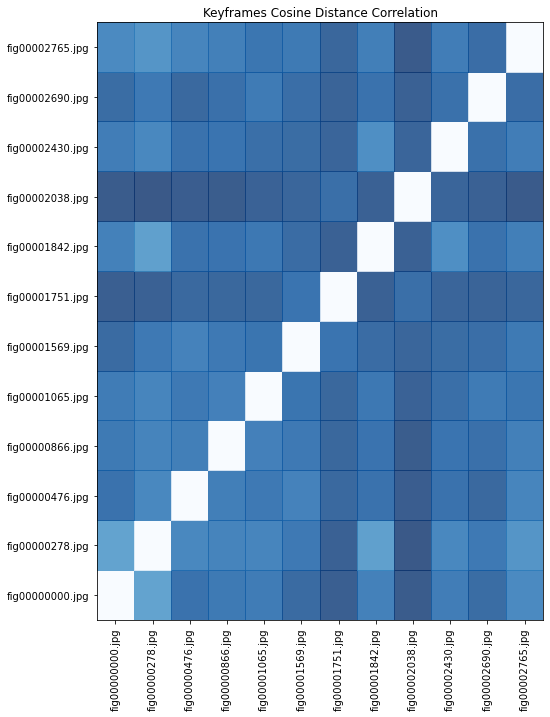

In [33]:
dense, friendly = Util.correlate_distances(step2frames, do_plot=True)


In [34]:
step3frames = step2frames
scenes = Util.generate_scenes(step3frames)

Analyzing frames 0 to 278...
PCA components = 3
['fig00000022.jpg', 'fig00000016.jpg', 'fig00000000.jpg']
Analyzing frames 278 to 476...
PCA components = 2
['fig00000358.jpg', 'fig00000278.jpg']
Analyzing frames 476 to 866...
PCA components = 3
['fig00000486.jpg', 'fig00000507.jpg', 'fig00000476.jpg']
Analyzing frames 866 to 1065...
PCA components = 4
['fig00000983.jpg', 'fig00000866.jpg', 'fig00000957.jpg', 'fig00000887.jpg']
Analyzing frames 1065 to 1569...
PCA components = 3
['fig00001140.jpg', 'fig00001327.jpg', 'fig00001065.jpg']
Analyzing frames 1569 to 1751...


<ipython-input-8-05d1268285aa>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


PCA components = 6
['fig00001627.jpg', 'fig00001593.jpg', 'fig00001574.jpg', 'fig00001720.jpg', 'fig00001697.jpg', 'fig00001569.jpg']
Analyzing frames 1751 to 1842...


<ipython-input-8-05d1268285aa>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


PCA components = 3
['fig00001796.jpg', 'fig00001751.jpg', 'fig00001769.jpg']
Analyzing frames 1842 to 2038...


<ipython-input-8-05d1268285aa>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


PCA components = 8
['fig00001912.jpg', 'fig00001855.jpg', 'fig00001890.jpg', 'fig00001954.jpg', 'fig00001852.jpg', 'fig00001975.jpg', 'fig00001842.jpg', 'fig00001998.jpg']
Analyzing frames 2038 to 2430...


<ipython-input-8-05d1268285aa>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


PCA components = 7
['fig00002060.jpg', 'fig00002038.jpg', 'fig00002088.jpg', 'fig00002050.jpg', 'fig00002048.jpg', 'fig00002382.jpg', 'fig00002127.jpg']
Analyzing frames 2430 to 2690...


<ipython-input-8-05d1268285aa>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


PCA components = 7
['fig00002430.jpg', 'fig00002577.jpg', 'fig00002512.jpg', 'fig00002572.jpg', 'fig00002608.jpg', 'fig00002650.jpg', 'fig00002525.jpg']
Analyzing frames 2690 to 2765...


<ipython-input-8-05d1268285aa>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


PCA components = 4
['fig00002697.jpg', 'fig00002690.jpg', 'fig00002744.jpg', 'fig00002723.jpg']
Analyzing frames 2765 to 2766...


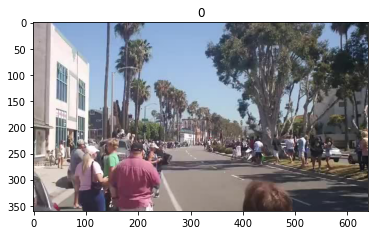

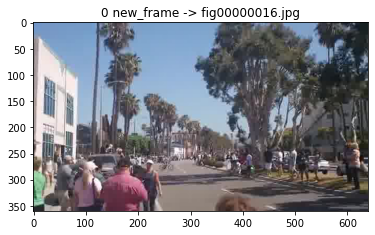

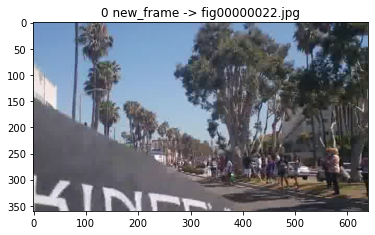

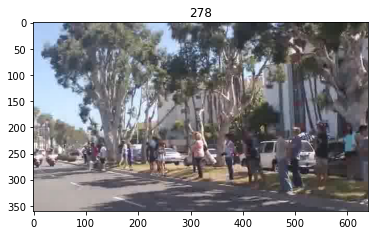

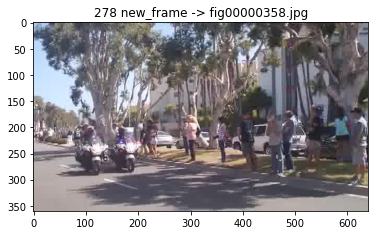

...

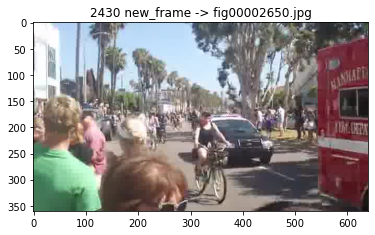

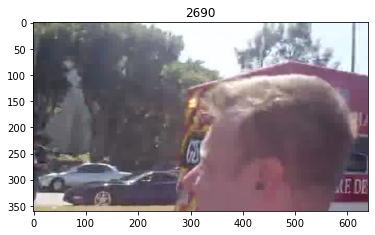

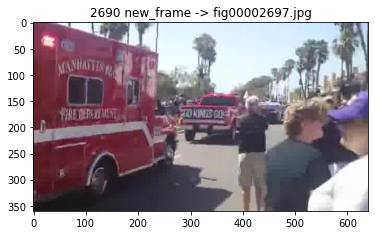

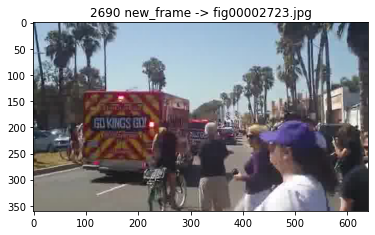

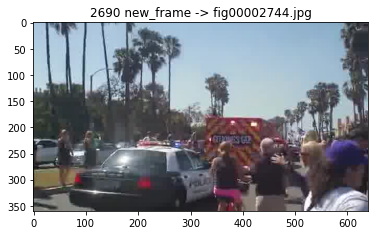

In [35]:
second_pass = SecondPass(scenes)
step4frames = second_pass.process(variance=0.8)

In [36]:
step5frames = step4frames


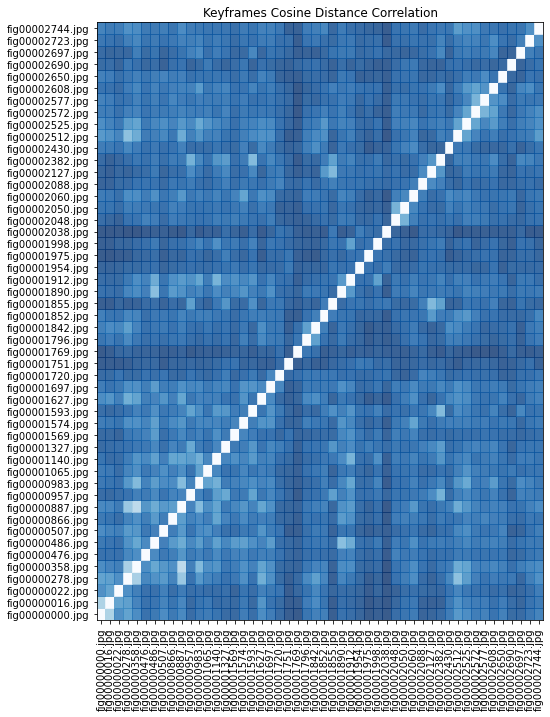

In [37]:
dense, friendly = Util.correlate_distances(step5frames, do_plot=True)


In [38]:
simm = SimilarityMatcher(step5frames, dense, friendly)
step6frames = simm.process()


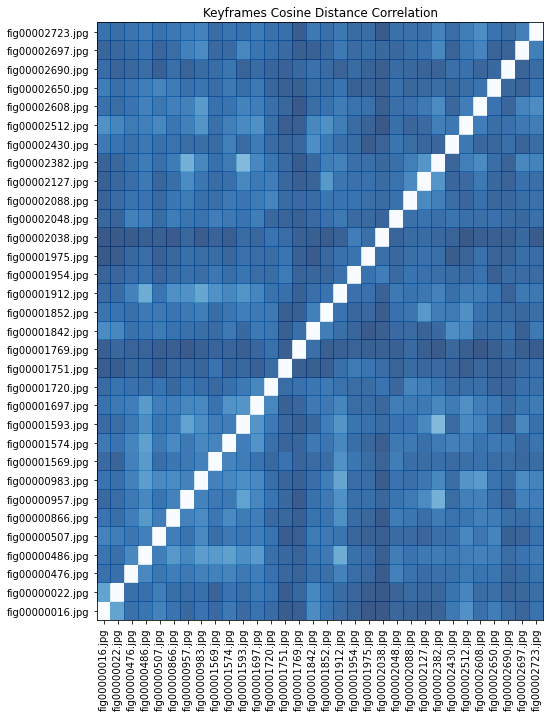

In [39]:
dense, friendly = Util.correlate_distances(step6frames, do_plot=True)


<ipython-input-3-124fde6764e9>:121: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


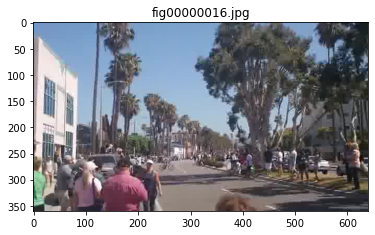

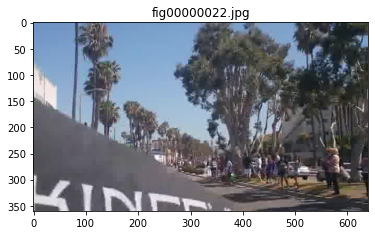

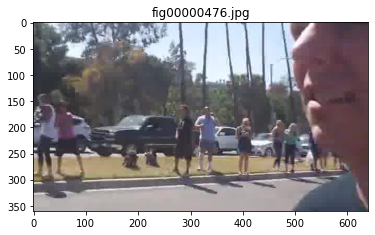

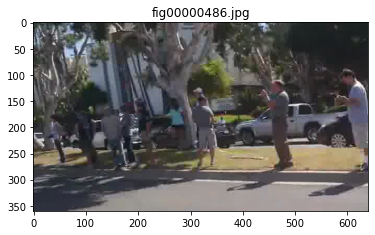

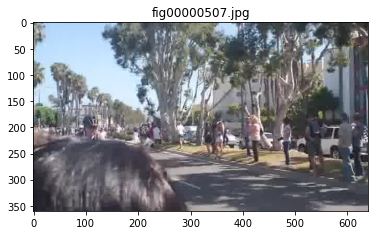

...

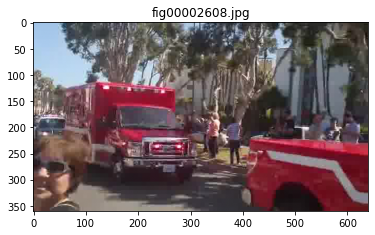

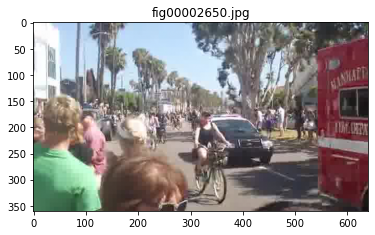

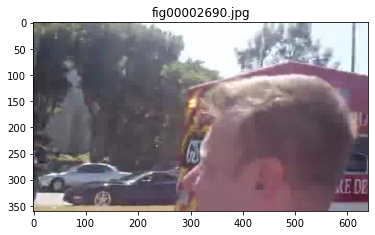

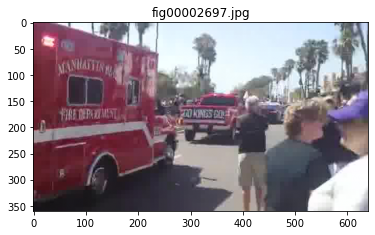

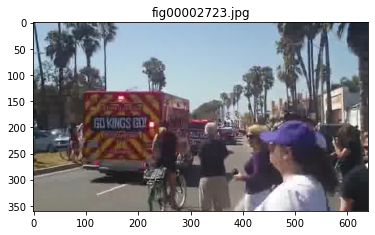

In [40]:
Util.dump_frames(step6frames)


In [41]:
Util.dump_frame_index(step6frames)


16
22
476
486
507
866
957
983
1569
1574
1593
1697
1720
1751
1769
1842
1852
1912
1954
1975
2038
2048
2088
2127
2382
2430
2512
2608
2650
2690
2697
2723
Keyframes info written to /Users/User\dataset2\keyframes.txt


In [42]:
Util.pack_features(step6frames)


In [1]:
from PIL import Image

In [4]:
print(os.getcwd()) 


C:\Users\User


In [6]:
os.chdir("C:\\Users\\User\\images")  
path = "C:\\Users\\User\\images"


In [13]:
path = "C:\\Users\\User\\images"

mean_height = 0
mean_width = 0
  
num_of_images = len(os.listdir(path))
# print(num_of_images)
#file = "images"
#path =  "C:\\Users\\User"
  
for file in os.listdir(path):
    im = Image.open(os.path.join(path, file))
    width, height = im.size
    mean_width += width
    mean_height += height
    # im.show()   # uncomment this for displaying the image
  
# Finding the mean height and width of all images.
# This is required because the video frame needs
# to be set with same width and height. Otherwise
# images not equal to that width height will not get 
# embedded into the video
mean_width = int(mean_width / num_of_images)
mean_height = int(mean_height / num_of_images)
  
# print(mean_height)
# print(mean_width)
  
# Resizing of the images to give
# them same width and height 
for file in os.listdir(path):
    if file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith("png"):
        # opening image using PIL Image
        im = Image.open(os.path.join(path, file)) 
   
        # im.size includes the height and width of image
        width, height = im.size   
        print(width, height)
  
        # resizing 
        imResize = im.resize((mean_width, mean_height), Image.ANTIALIAS) 
        imResize.save( file, 'JPEG', quality = 95) # setting quality
        # printing each resized image name
        print(im.filename.split('\\')[-1], " is resized") 
  
  
# Video Generating function
def generate_video():
    image_folder = '.' # make sure to use your folder
    video_name = 'mygeneratedvideo.avi'
    os.chdir("C:\\Users\\User\\images")
      
    imagess = [img for img in os.listdir(image_folder)
              if img.endswith(".jpg") or
                 img.endswith(".jpeg") or
                 img.endswith("png")]
     
    # Array images should only consider
    # the image files ignoring others if any
    print(imagess) 
  
    frame = cv2.imread(os.path.join(image_folder, imagess[0]))
  
    # setting the frame width, height width
    # the width, height of first image
    height, width, layers = frame.shape  
  
    video = cv2.VideoWriter(video_name, 0, 1, (width, height)) 
  
    # Appending the images to the video one by one
    for image in imagess: 
        video.write(cv2.imread(os.path.join(image_folder, image))) 
      
    # Deallocating memories taken for window creation
    cv2.destroyAllWindows() 
    video.release()  # releasing the video generated
  
  
# Calling the generate_video function
generate_video()

640 360
fig00000016.jpg  is resized
640 360
fig00000022.jpg  is resized
640 360
fig00000476.jpg  is resized
640 360
fig00000486.jpg  is resized
640 360
fig00000507.jpg  is resized
640 360
fig00000886.jpg  is resized
640 360
fig00000957.jpg  is resized
640 360
fig00000983.jpg  is resized
640 360
fig00001569.jpg  is resized
640 360
fig00001574.jpg  is resized
640 360
fig00001593.jpg  is resized
640 360
fig00001697.jpg  is resized
640 360
fig00001720.jpg  is resized
640 360
fig00001751.jpg  is resized
640 360
fig00001842.jpg  is resized
640 360
fig00001852.jpg  is resized
640 360
fig00001912.jpg  is resized
640 360
fig00001954.jpg  is resized
640 360
fig00001975.jpg  is resized
640 360
fig00002038.jpg  is resized
640 360
fig00002048.jpg  is resized
640 360
fig00002088.jpg  is resized
640 360
fig00002127.jpg  is resized
640 360
fig00002382.jpg  is resized
640 360
fig00002430.jpg  is resized
640 360
fig00002512.jpg  is resized
640 360
fig00002608.jpg  is resized
640 360
fig00002650.jpg  is 

In [8]:
import cv2 
